In [2]:
import os
os.chdir("/content/drive/MyDrive/Colab Notebooks/GAN_Nebula")

Found 1623 files belonging to 1 classes.


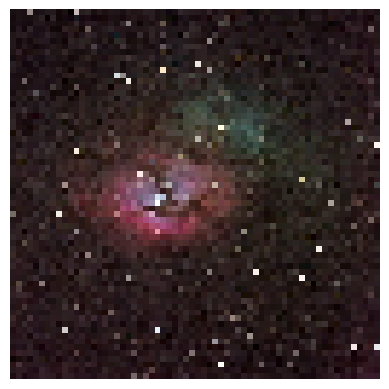

In [3]:
import os
from zipfile import ZipFile

from tensorflow import keras
import matplotlib.pyplot as plt
import gdown

def get_nebula_data():
    dataset = keras.preprocessing.image_dataset_from_directory(
        "img_448_size", label_mode=None, image_size=(64, 64), batch_size=32
    )
    dataset = dataset.map(lambda x: x / 255.0)
    return dataset

def show_one_in_list(dataset):
    for x in dataset:
        plt.axis("off")
        plt.imshow((x.numpy() * 255).astype("int32")[0])
        plt.show()
        break

if __name__ == "__main__":
    dataset = get_nebula_data()
    show_one_in_list(dataset)

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [5]:
def make_discriminator():
    discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dropout(0.2),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
    )
    discriminator.summary()
    return discriminator

In [6]:
def make_generator():
    latent_dim = 128

    generator = keras.Sequential(
        [
            keras.Input(shape=(latent_dim,)),
            layers.Dense(8 * 8 * 128),
            layers.Reshape((8, 8, 128)),
            layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"),
            layers.LeakyReLU(alpha=0.2),
            layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"),
            layers.LeakyReLU(alpha=0.2),
            layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"),
            layers.LeakyReLU(alpha=0.2),
            layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
        ],
        name="generator",
    )
    generator.summary()
    return generator

In [7]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        generated_images = self.generator(random_latent_vectors)

        combined_images = tf.concat([generated_images, real_images], axis=0)

        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        misleading_labels = tf.zeros((batch_size, 1))

        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [8]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, start_epoch=0, latent_dim=128):
        self.start_epoch = start_epoch
        self.num_img = 64
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        cur_epoch = epoch + self.start_epoch
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()

        fig, axs = plt.subplots(8, 8)
        count = 0
        for j in range(8):
          for k in range(8):
            axs[j, k].imshow(generated_images[count])
            axs[j, k].axis("off")
            count += 1
        fig.savefig("./tf_results/gan_nebula%03d.png" % (cur_epoch))

        self.model.generator.save('./models/generator/%d' % (cur_epoch))
        self.model.discriminator.save('./models/discriminator/%d' % (cur_epoch))

In [9]:
def load_model(path, role):
    model_num = -1
    list_path = path + '/' + role
    for num in os.listdir(list_path):
        if int(num) > model_num:
            model_num = int(num)

    if model_num == -1:
        if role == "discriminator":
            return make_discriminator()
        elif role == "generator":
            return make_generator()
        else:
            raise "invalid argument error"
    else:
        model_path = list_path + '/' + str(model_num)
        return keras.models.load_model(model_path)

Found 1623 files belonging to 1 classes.
Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Fl

51/51 [==============================] - 40s 443ms/step - d_loss: 0.5573 - g_loss: 0.9683
Epoch 2/100
51/51 [==============================] - ETA: 0s - d_loss: 0.3473 - g_loss: 1.0035

51/51 [==============================] - 18s 343ms/step - d_loss: 0.3473 - g_loss: 1.0035
Epoch 3/100
51/51 [==============================] - ETA: 0s - d_loss: 0.1449 - g_loss: 4.0571

51/51 [==============================] - 19s 357ms/step - d_loss: 0.1449 - g_loss: 4.0571
Epoch 4/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6244 - g_loss: 2.6019

51/51 [==============================] - 19s 354ms/step - d_loss: 0.6244 - g_loss: 2.6019
Epoch 5/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5612 - g_loss: 2.1101

51/51 [==============================] - 19s 360ms/step - d_loss: 0.5612 - g_loss: 2.1101
Epoch 6/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6811 - g_loss: 1.1890

51/51 [==============================] - 20s 386ms/step - d_loss: 0.6811 - g_loss: 1.1890
Epoch 7/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5592 - g_loss: 1.2378

51/51 [==============================] - 19s 368ms/step - d_loss: 0.5592 - g_loss: 1.2378
Epoch 8/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5607 - g_loss: 1.1920

51/51 [==============================] - 21s 397ms/step - d_loss: 0.5607 - g_loss: 1.1920
Epoch 9/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5059 - g_loss: 1.1490

51/51 [==============================] - 19s 361ms/step - d_loss: 0.5059 - g_loss: 1.1490
Epoch 10/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5287 - g_loss: 2.6659

51/51 [==============================] - 20s 371ms/step - d_loss: 0.5287 - g_loss: 2.6659
Epoch 11/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6175 - g_loss: 2.4008

51/51 [==============================] - 20s 377ms/step - d_loss: 0.6175 - g_loss: 2.4008
Epoch 12/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5971 - g_loss: 2.6687

51/51 [==============================] - 19s 370ms/step - d_loss: 0.5971 - g_loss: 2.6687
Epoch 13/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4655 - g_loss: 1.5810

51/51 [==============================] - 21s 382ms/step - d_loss: 0.4655 - g_loss: 1.5810
Epoch 14/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4978 - g_loss: 1.1769

51/51 [==============================] - 19s 370ms/step - d_loss: 0.4978 - g_loss: 1.1769
Epoch 15/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6485 - g_loss: 1.0400

51/51 [==============================] - 20s 362ms/step - d_loss: 0.6485 - g_loss: 1.0400
Epoch 16/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5368 - g_loss: 1.2116

51/51 [==============================] - 21s 403ms/step - d_loss: 0.5368 - g_loss: 1.2116
Epoch 17/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4281 - g_loss: 1.3846

51/51 [==============================] - 20s 380ms/step - d_loss: 0.4281 - g_loss: 1.3846
Epoch 18/100
51/51 [==============================] - ETA: 0s - d_loss: 0.3831 - g_loss: 1.4100

51/51 [==============================] - 21s 381ms/step - d_loss: 0.3831 - g_loss: 1.4100
Epoch 19/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5985 - g_loss: 1.3134

51/51 [==============================] - 19s 371ms/step - d_loss: 0.5985 - g_loss: 1.3134
Epoch 20/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7461 - g_loss: 1.3579

51/51 [==============================] - 21s 382ms/step - d_loss: 0.7461 - g_loss: 1.3579
Epoch 21/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7970 - g_loss: 1.5296

<ipython-input-8-b2576bccda13>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(8, 8)


51/51 [==============================] - 19s 369ms/step - d_loss: 0.7970 - g_loss: 1.5296
Epoch 22/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5301 - g_loss: 1.6824

51/51 [==============================] - 20s 374ms/step - d_loss: 0.5301 - g_loss: 1.6824
Epoch 23/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5748 - g_loss: 1.6745

51/51 [==============================] - 19s 366ms/step - d_loss: 0.5748 - g_loss: 1.6745
Epoch 24/100
51/51 [==============================] - ETA: 0s - d_loss: 0.8011 - g_loss: 0.6238

51/51 [==============================] - 21s 409ms/step - d_loss: 0.8011 - g_loss: 0.6238
Epoch 25/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6143 - g_loss: 0.7431

51/51 [==============================] - 20s 381ms/step - d_loss: 0.6143 - g_loss: 0.7431
Epoch 26/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7114 - g_loss: 0.9138

51/51 [==============================] - 20s 380ms/step - d_loss: 0.7114 - g_loss: 0.9138
Epoch 27/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6694 - g_loss: 0.7173

51/51 [==============================] - 20s 382ms/step - d_loss: 0.6694 - g_loss: 0.7173
Epoch 28/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5849 - g_loss: 0.9601

51/51 [==============================] - 20s 371ms/step - d_loss: 0.5849 - g_loss: 0.9601
Epoch 29/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7191 - g_loss: 0.8284

51/51 [==============================] - 22s 415ms/step - d_loss: 0.7191 - g_loss: 0.8284
Epoch 30/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4338 - g_loss: 1.2228

51/51 [==============================] - 20s 390ms/step - d_loss: 0.4338 - g_loss: 1.2228
Epoch 31/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7548 - g_loss: 1.0735

51/51 [==============================] - 20s 379ms/step - d_loss: 0.7548 - g_loss: 1.0735
Epoch 32/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7102 - g_loss: 0.9273

51/51 [==============================] - 20s 371ms/step - d_loss: 0.7102 - g_loss: 0.9273
Epoch 33/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7142 - g_loss: 0.9566

51/51 [==============================] - 19s 358ms/step - d_loss: 0.7142 - g_loss: 0.9566
Epoch 34/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5790 - g_loss: 0.7569

51/51 [==============================] - 19s 367ms/step - d_loss: 0.5790 - g_loss: 0.7569
Epoch 35/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7450 - g_loss: 0.8857

51/51 [==============================] - 20s 375ms/step - d_loss: 0.7450 - g_loss: 0.8857
Epoch 36/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5490 - g_loss: 1.4471

51/51 [==============================] - 22s 416ms/step - d_loss: 0.5490 - g_loss: 1.4471
Epoch 37/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5389 - g_loss: 1.3411

51/51 [==============================] - 19s 367ms/step - d_loss: 0.5389 - g_loss: 1.3411
Epoch 38/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6505 - g_loss: 1.0201

51/51 [==============================] - 20s 379ms/step - d_loss: 0.6505 - g_loss: 1.0201
Epoch 39/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5846 - g_loss: 1.0055

51/51 [==============================] - 20s 373ms/step - d_loss: 0.5846 - g_loss: 1.0055
Epoch 40/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6714 - g_loss: 1.3516

51/51 [==============================] - 20s 376ms/step - d_loss: 0.6714 - g_loss: 1.3516
Epoch 41/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5193 - g_loss: 1.3653

51/51 [==============================] - 19s 359ms/step - d_loss: 0.5193 - g_loss: 1.3653
Epoch 42/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7870 - g_loss: 1.2162

51/51 [==============================] - 20s 389ms/step - d_loss: 0.7870 - g_loss: 1.2162
Epoch 43/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6315 - g_loss: 0.8105

51/51 [==============================] - 22s 417ms/step - d_loss: 0.6315 - g_loss: 0.8105
Epoch 44/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5106 - g_loss: 0.9696

51/51 [==============================] - 20s 377ms/step - d_loss: 0.5106 - g_loss: 0.9696
Epoch 45/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7817 - g_loss: 0.9802

51/51 [==============================] - 19s 364ms/step - d_loss: 0.7817 - g_loss: 0.9802
Epoch 46/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5830 - g_loss: 1.3623

51/51 [==============================] - 20s 375ms/step - d_loss: 0.5830 - g_loss: 1.3623
Epoch 47/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4927 - g_loss: 1.1313

51/51 [==============================] - 20s 363ms/step - d_loss: 0.4927 - g_loss: 1.1313
Epoch 48/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6905 - g_loss: 1.2266

51/51 [==============================] - 19s 365ms/step - d_loss: 0.6905 - g_loss: 1.2266
Epoch 49/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5834 - g_loss: 1.2246

51/51 [==============================] - 20s 389ms/step - d_loss: 0.5834 - g_loss: 1.2246
Epoch 50/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7161 - g_loss: 1.2489

51/51 [==============================] - 19s 368ms/step - d_loss: 0.7161 - g_loss: 1.2489
Epoch 51/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5209 - g_loss: 1.4114

51/51 [==============================] - 20s 383ms/step - d_loss: 0.5209 - g_loss: 1.4114
Epoch 52/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7444 - g_loss: 0.8334

51/51 [==============================] - 23s 427ms/step - d_loss: 0.7444 - g_loss: 0.8334
Epoch 53/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6476 - g_loss: 1.0934

51/51 [==============================] - 19s 367ms/step - d_loss: 0.6476 - g_loss: 1.0934
Epoch 54/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4979 - g_loss: 1.4395

51/51 [==============================] - 21s 398ms/step - d_loss: 0.4979 - g_loss: 1.4395
Epoch 55/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6524 - g_loss: 1.1088

51/51 [==============================] - 20s 380ms/step - d_loss: 0.6524 - g_loss: 1.1088
Epoch 56/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6272 - g_loss: 1.1320

51/51 [==============================] - 20s 382ms/step - d_loss: 0.6272 - g_loss: 1.1320
Epoch 57/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6537 - g_loss: 1.2159

51/51 [==============================] - 20s 388ms/step - d_loss: 0.6537 - g_loss: 1.2159
Epoch 58/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7216 - g_loss: 0.9903

51/51 [==============================] - 20s 388ms/step - d_loss: 0.7216 - g_loss: 0.9903
Epoch 59/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6240 - g_loss: 1.3441

51/51 [==============================] - 21s 381ms/step - d_loss: 0.6240 - g_loss: 1.3441
Epoch 60/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7208 - g_loss: 0.9181

51/51 [==============================] - 20s 368ms/step - d_loss: 0.7208 - g_loss: 0.9181
Epoch 61/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5528 - g_loss: 1.1395

51/51 [==============================] - 21s 392ms/step - d_loss: 0.5528 - g_loss: 1.1395
Epoch 62/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4875 - g_loss: 1.5333

51/51 [==============================] - 24s 443ms/step - d_loss: 0.4875 - g_loss: 1.5333
Epoch 63/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6538 - g_loss: 1.2610

51/51 [==============================] - 19s 364ms/step - d_loss: 0.6538 - g_loss: 1.2610
Epoch 64/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5705 - g_loss: 1.1644

51/51 [==============================] - 21s 395ms/step - d_loss: 0.5705 - g_loss: 1.1644
Epoch 65/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6711 - g_loss: 1.5497

51/51 [==============================] - 20s 375ms/step - d_loss: 0.6711 - g_loss: 1.5497
Epoch 66/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7149 - g_loss: 1.0688

51/51 [==============================] - 19s 365ms/step - d_loss: 0.7149 - g_loss: 1.0688
Epoch 67/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6053 - g_loss: 1.0590

51/51 [==============================] - 20s 381ms/step - d_loss: 0.6053 - g_loss: 1.0590
Epoch 68/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5917 - g_loss: 1.0149

51/51 [==============================] - 20s 372ms/step - d_loss: 0.5917 - g_loss: 1.0149
Epoch 69/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5938 - g_loss: 1.0608

51/51 [==============================] - 20s 372ms/step - d_loss: 0.5938 - g_loss: 1.0608
Epoch 70/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6244 - g_loss: 1.1063

51/51 [==============================] - 20s 379ms/step - d_loss: 0.6244 - g_loss: 1.1063
Epoch 71/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6669 - g_loss: 0.9629

51/51 [==============================] - 19s 367ms/step - d_loss: 0.6669 - g_loss: 0.9629
Epoch 72/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5970 - g_loss: 1.0167

51/51 [==============================] - 20s 386ms/step - d_loss: 0.5970 - g_loss: 1.0167
Epoch 73/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5755 - g_loss: 1.4282

51/51 [==============================] - 20s 371ms/step - d_loss: 0.5755 - g_loss: 1.4282
Epoch 74/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5414 - g_loss: 1.0118

51/51 [==============================] - 24s 463ms/step - d_loss: 0.5414 - g_loss: 1.0118
Epoch 75/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6664 - g_loss: 1.4361

51/51 [==============================] - 20s 381ms/step - d_loss: 0.6664 - g_loss: 1.4361
Epoch 76/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5635 - g_loss: 1.4227

51/51 [==============================] - 21s 384ms/step - d_loss: 0.5635 - g_loss: 1.4227
Epoch 77/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6795 - g_loss: 1.5944

51/51 [==============================] - 20s 378ms/step - d_loss: 0.6795 - g_loss: 1.5944
Epoch 78/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5724 - g_loss: 1.2646

51/51 [==============================] - 20s 371ms/step - d_loss: 0.5724 - g_loss: 1.2646
Epoch 79/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6702 - g_loss: 1.4823

51/51 [==============================] - 19s 367ms/step - d_loss: 0.6702 - g_loss: 1.4823
Epoch 80/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6534 - g_loss: 1.0712

51/51 [==============================] - 20s 388ms/step - d_loss: 0.6534 - g_loss: 1.0712
Epoch 81/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4746 - g_loss: 1.2212

51/51 [==============================] - 20s 368ms/step - d_loss: 0.4746 - g_loss: 1.2212
Epoch 82/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6593 - g_loss: 1.5586

51/51 [==============================] - 20s 371ms/step - d_loss: 0.6593 - g_loss: 1.5586
Epoch 83/100
51/51 [==============================] - ETA: 0s - d_loss: 0.4708 - g_loss: 1.4798

51/51 [==============================] - 20s 366ms/step - d_loss: 0.4708 - g_loss: 1.4798
Epoch 84/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7533 - g_loss: 1.2194

51/51 [==============================] - 20s 372ms/step - d_loss: 0.7533 - g_loss: 1.2194
Epoch 85/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5456 - g_loss: 1.0406

51/51 [==============================] - 20s 374ms/step - d_loss: 0.5456 - g_loss: 1.0406
Epoch 86/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5860 - g_loss: 1.5329

51/51 [==============================] - 19s 369ms/step - d_loss: 0.5860 - g_loss: 1.5329
Epoch 87/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5980 - g_loss: 1.3197

51/51 [==============================] - 20s 377ms/step - d_loss: 0.5980 - g_loss: 1.3197
Epoch 88/100
51/51 [==============================] - ETA: 0s - d_loss: 0.9162 - g_loss: 1.6138

51/51 [==============================] - 25s 481ms/step - d_loss: 0.9162 - g_loss: 1.6138
Epoch 89/100
51/51 [==============================] - ETA: 0s - d_loss: 0.3932 - g_loss: 1.2460

51/51 [==============================] - 19s 371ms/step - d_loss: 0.3932 - g_loss: 1.2460
Epoch 90/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7214 - g_loss: 1.0934

51/51 [==============================] - 22s 404ms/step - d_loss: 0.7214 - g_loss: 1.0934
Epoch 91/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6292 - g_loss: 0.8865

51/51 [==============================] - 20s 373ms/step - d_loss: 0.6292 - g_loss: 0.8865
Epoch 92/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5586 - g_loss: 1.1346

51/51 [==============================] - 20s 371ms/step - d_loss: 0.5586 - g_loss: 1.1346
Epoch 93/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6510 - g_loss: 1.5697

51/51 [==============================] - 20s 369ms/step - d_loss: 0.6510 - g_loss: 1.5697
Epoch 94/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7107 - g_loss: 1.0009

51/51 [==============================] - 20s 373ms/step - d_loss: 0.7107 - g_loss: 1.0009
Epoch 95/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5634 - g_loss: 1.4516

51/51 [==============================] - 21s 382ms/step - d_loss: 0.5634 - g_loss: 1.4516
Epoch 96/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5918 - g_loss: 0.8592

51/51 [==============================] - 19s 367ms/step - d_loss: 0.5918 - g_loss: 0.8592
Epoch 97/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7087 - g_loss: 0.9545

51/51 [==============================] - 20s 389ms/step - d_loss: 0.7087 - g_loss: 0.9545
Epoch 98/100
51/51 [==============================] - ETA: 0s - d_loss: 0.5790 - g_loss: 0.9971

51/51 [==============================] - 19s 368ms/step - d_loss: 0.5790 - g_loss: 0.9971
Epoch 99/100
51/51 [==============================] - ETA: 0s - d_loss: 0.6010 - g_loss: 1.3678

51/51 [==============================] - 20s 382ms/step - d_loss: 0.6010 - g_loss: 1.3678
Epoch 100/100
51/51 [==============================] - ETA: 0s - d_loss: 0.7371 - g_loss: 1.2282

51/51 [==============================] - 20s 372ms/step - d_loss: 0.7371 - g_loss: 1.2282


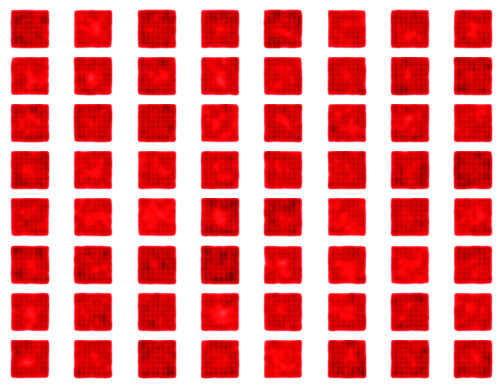

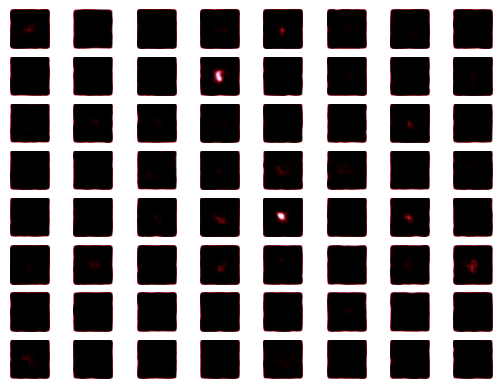

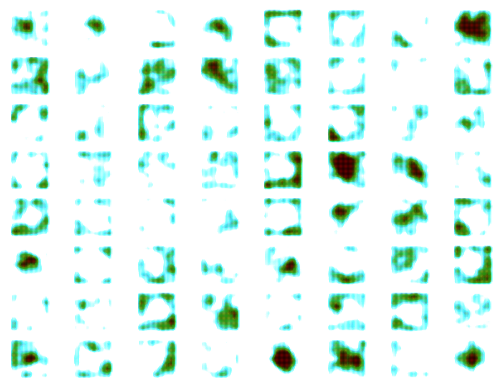

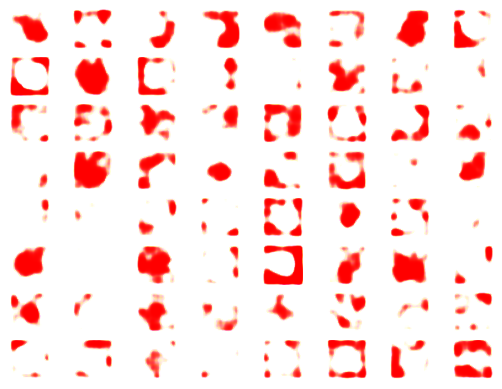

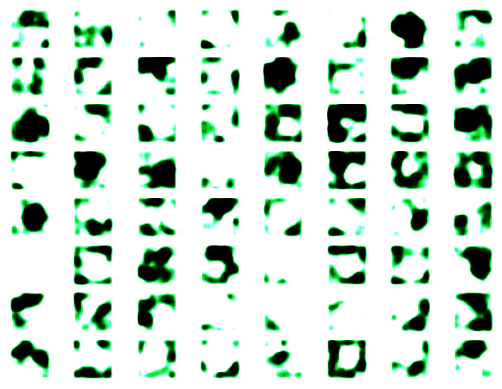

...

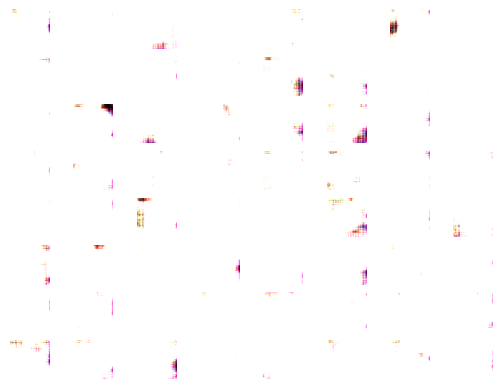

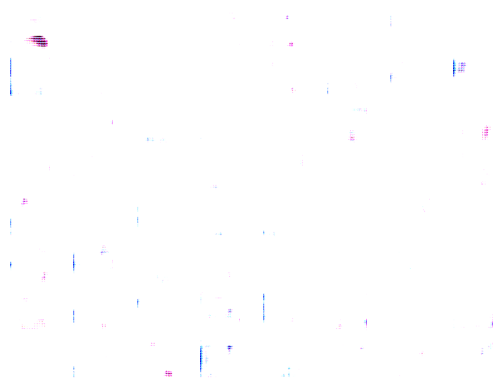

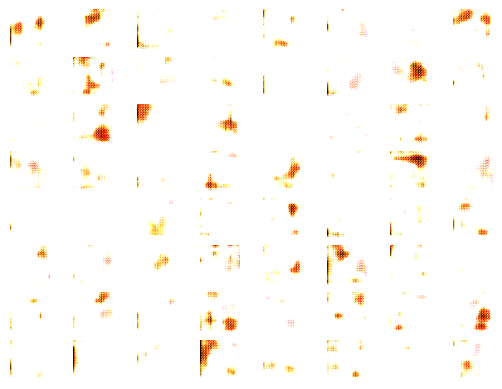

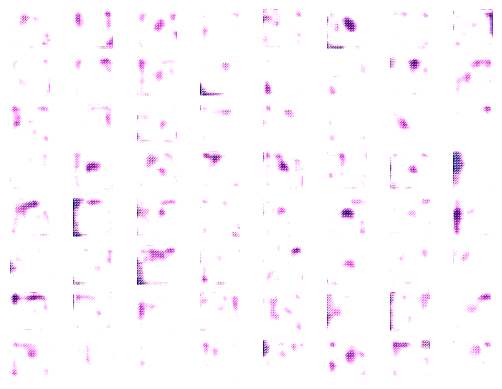

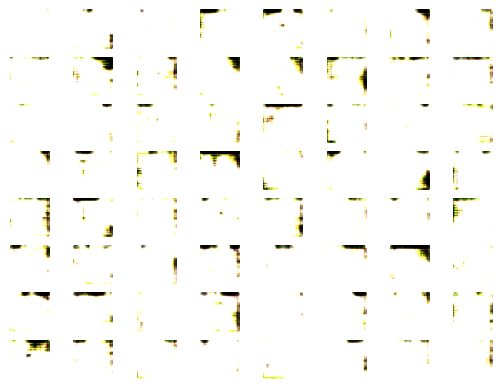

In [10]:
if __name__ == "__main__":
    dataset = get_nebula_data()

    folder_li = ["./models/discriminator", "./models/generator", "./tf_results"]
    for folder in folder_li:
      if not os.path.isdir(folder):
        os.makedirs(folder)

    discriminator = load_model('./models', "discriminator")
    generator = load_model('./models', "generator")

    latent_dim = 128
    start_epoch = 0
    epochs = 100  # In practice, use ~100 epochs

    gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
    gan.compile(
        d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        loss_fn=keras.losses.BinaryCrossentropy(),
    )

    gan.fit(
        dataset, epochs=epochs, callbacks=[GANMonitor(start_epoch=start_epoch, latent_dim=latent_dim)]
    )